### 1. Loading packages

library(Seurat)
library(SeuratData)
library(ggplot2)
library(cowplot)
library(dplyr)

In [2]:
args01 <- "filtered_feature_bc_matrix.h5" #h5 filename
args02 <- "mouse_kidney" #project name

In [3]:
expr.data <- Read10X_h5(filename = args01)
data <- CreateSeuratObject(counts=expr.data, project=args02, assay='Spatial')
data$slice <- 1
data$region <- 'D'
#data
img <- Read10X_Image(image.dir = 'spatial')
DefaultAssay(object = img) <- 'Spatial'
img <- img[colnames(x = data)]
data[['iamge']] <- img

In [4]:
data

An object of class Seurat 
31053 features across 2611 samples within 1 assay 
Active assay: Spatial (31053 features)

### 2. Data preprocessing

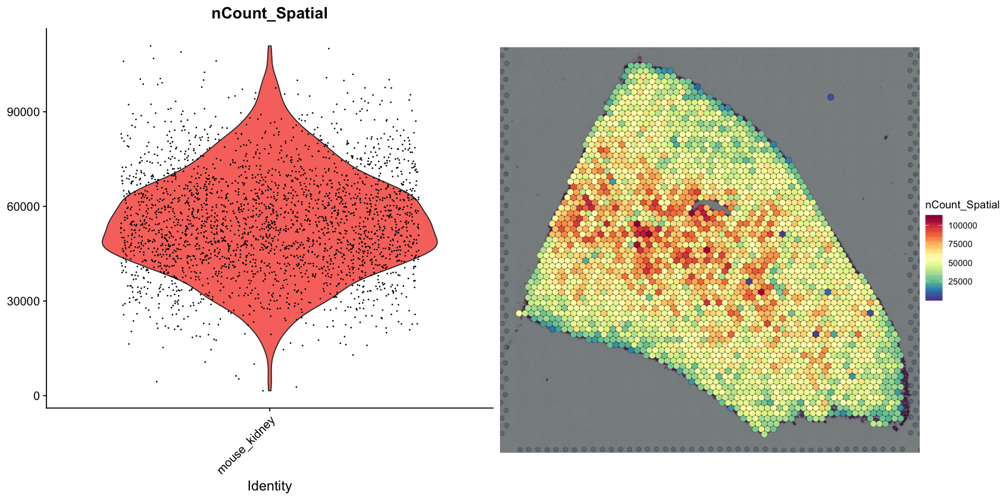

In [5]:
options(repr.plot.height=7, repr.plot.width=10)
plot1 <- VlnPlot(data, features = "nCount_Spatial", pt.size = 0.1) + NoLegend()
plot2 <- SpatialFeaturePlot(data, features = "nCount_Spatial") + theme(legend.position = "right")
options(repr.plot.width=14)
plot_grid(plot1, plot2)
#png("01-preprocess.png")
#plot_grid(plot1, plot2)
#dev.off()

data <- SCTransform(data, assay="Spatial", verbose = FALSE)

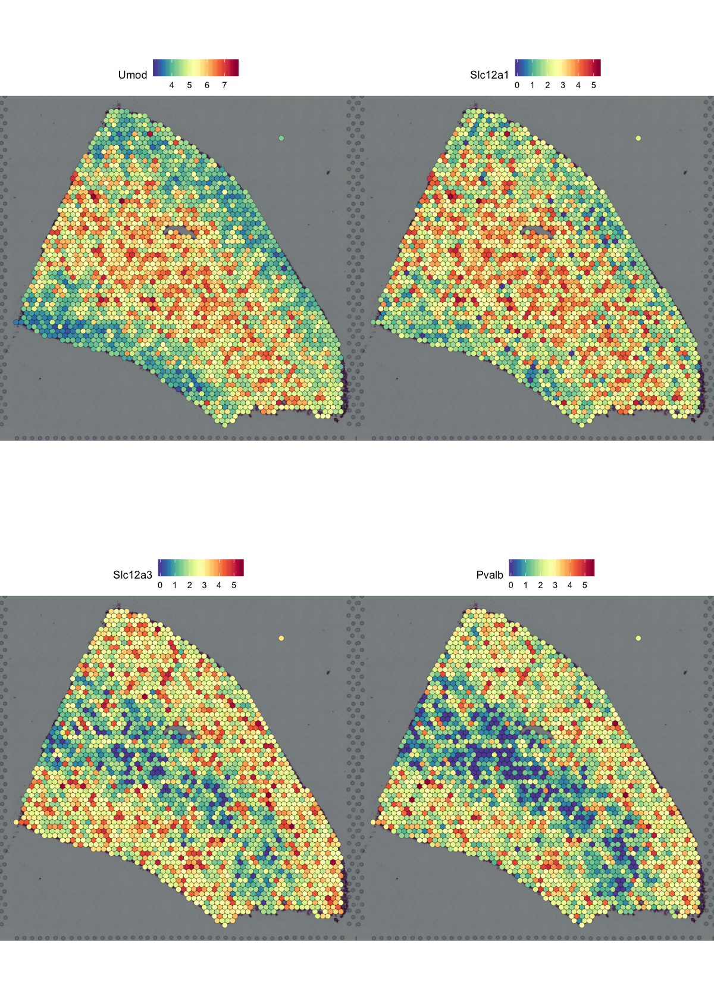

In [7]:
options(repr.plot.height=14, repr.plot.width=10)
interested_features <- c('Umod', 'Slc12a1', 'Slc12a3', 'Pvalb') #plotting specific features
SpatialFeaturePlot(data, features = interested_features)

data <- RunPCA(data, assay = "SCT", verbose = FALSE)
data <- FindNeighbors(data, reduction = "pca", dims = 1:30)
data <- FindClusters(data, verbose = FALSE)
data <- RunUMAP(data, reduction = "pca", dims = 1:30)

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


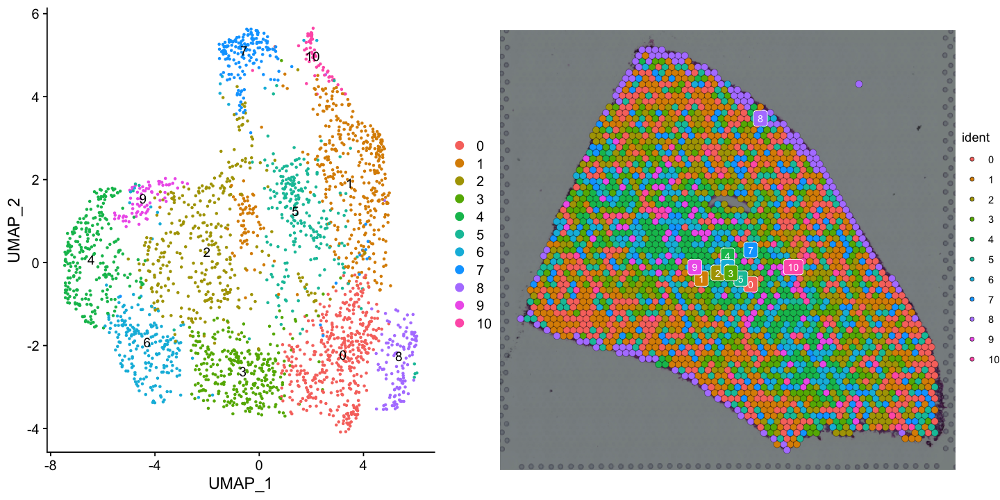

In [9]:
options(repr.plot.height=6, repr.plot.width=12)
p1 <- DimPlot(data, reduction = "umap", label = TRUE)
p2 <- SpatialDimPlot(data, label = TRUE, label.size = 3)
plot_grid(p1, p2)

sample.markers <- FindAllMarkers(data, min.pct = 0.3, logfc.threshold = 0.3)
sample.markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_logFC)
markers10 <- sample.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

write.table(sample.markers, file=paste(args02,'_all_markers.tsv',sep=''), sep='\t', na='', row.names=T, col.names=NA, quote=F)
write.table(markers10, file=paste(args02,'_top10_markers.tsv',sep=''), sep='\t', na='', row.names=T, col.names=NA, quote=F)

cluster0: S1 proximal tubule cells
cluster1: Distal convoluted tubule cell / Intercalated cell / Principal cell
cluster2: Ascending loop of henle
cluster3: Proximal tubule brush border cell
cluster4: S3 proximal tubule cells
cluster5: Distal convoluted tubule cell
cluster6: S3 proximal tubule cells
cluster7: Stromal cell (?)
cluster8: Dendritic cell (?)
cluster9: (S1) Proximal tubule cell
cluster10: Stromal cell

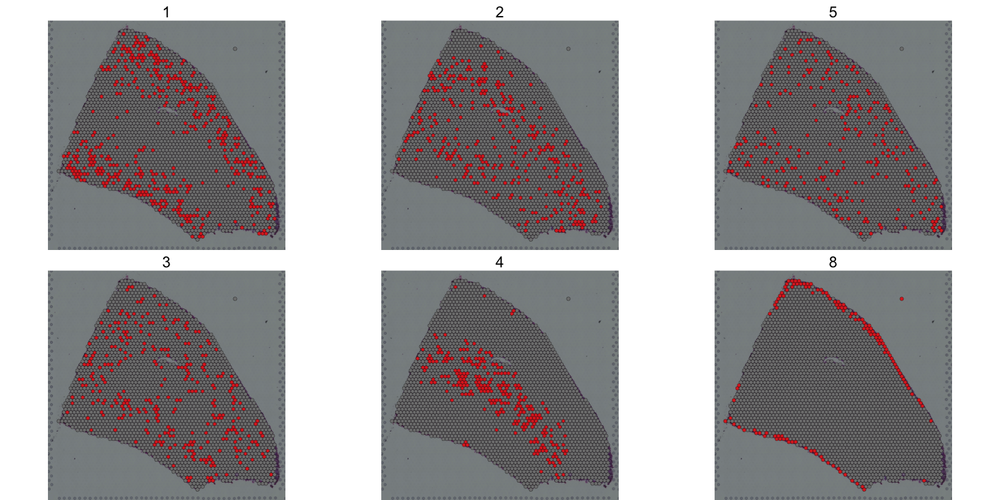

In [12]:
SpatialDimPlot(data, cells.highlight = CellsByIdentities(object = data, idents = c(1, 2, 5, 3, 4, 8)), facet.highlight = TRUE, ncol = 3)

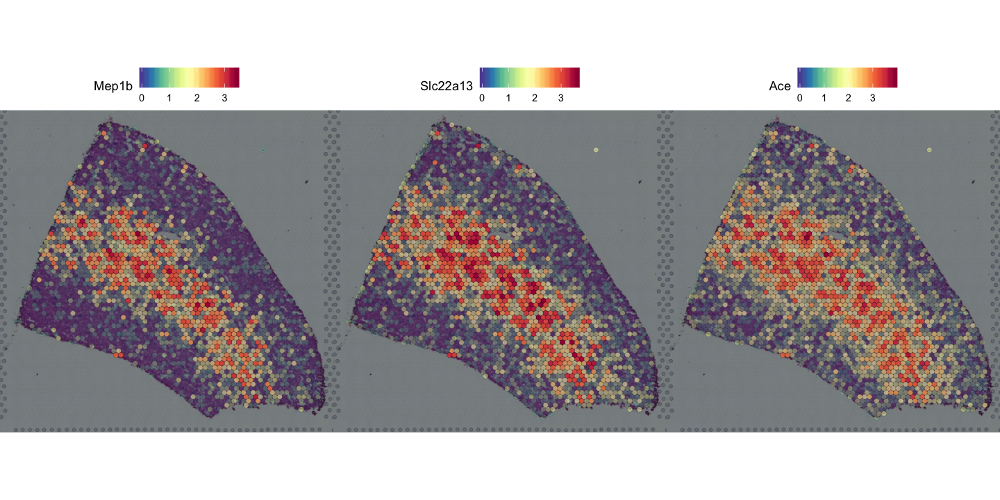

In [13]:
de_markers <- FindMarkers(data, ident.1 = 4, ident.2 = 8)
SpatialFeaturePlot(object = data, features = rownames(de_markers)[1:3], alpha = c(0.1, 1), ncol = 3)

In [14]:
data <- FindSpatiallyVariableFeatures(data, assay = "SCT", features = VariableFeatures(data)[1:1000], selection.method = "markvariogram")
top.features <- head(SpatiallyVariableFeatures(data, selection.method = "markvariogram"), 6)

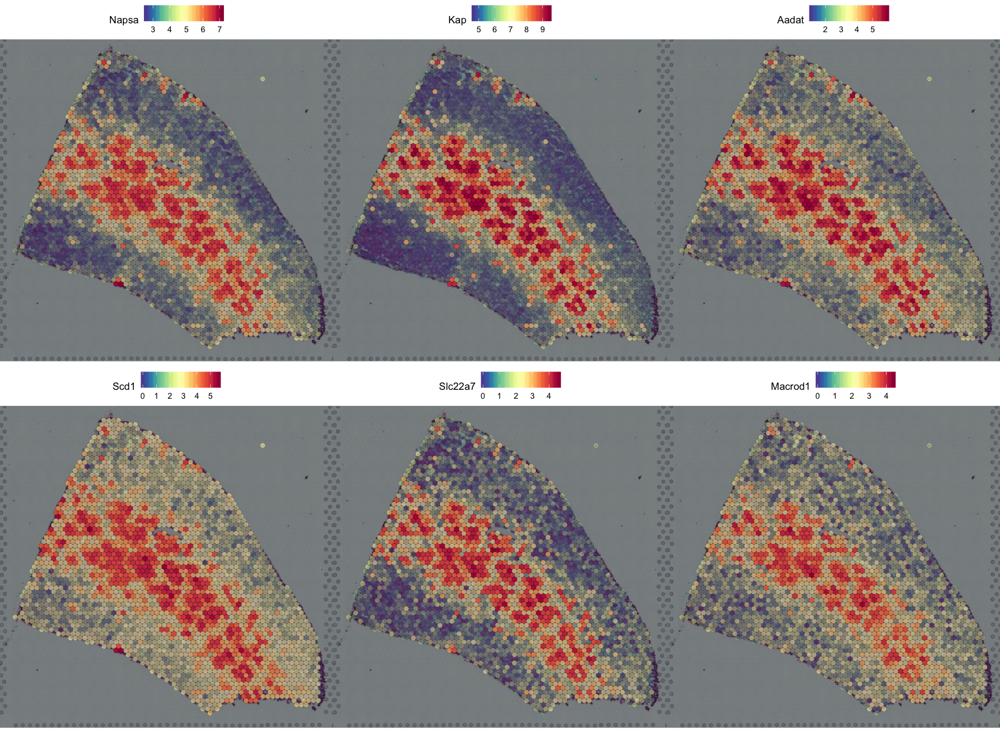

In [15]:
options(repr.plot.height=11, repr.plot.width=15)
SpatialFeaturePlot(data, features = top.features, ncol = 3, alpha = c(0.1, 1))

In [16]:
saveRDS(data, file=paste(args02, "_seurat1.rds", sep = ""))

In [17]:
data <- readRDS(file=paste(args02, "_seurat1.rds", sep = ""))

In [18]:
head(SpatiallyVariableFeatures(data, selection.method = "markvariogram"), 20)

[1] "Napsa"     "Kap"       "Aadat"     "Scd1"      "Slc22a7"   "Macrod1"  
 [7] "mt-Nd2"    "Mpv17l"    "Serpina1f" "Slco1a6"   "Acadm"     "Slc22a19" 
[13] "mt-Nd4"    "Ppic"      "S100g"     "Slc22a13"  "Slc9a8"    "Defb29"   
[19] "Slc6a18"   "Ace"

In [19]:
kidney_single_reference <- readRDS("../MCA_kidney/MCA_kidney_label.rds")

kidney_single_reference <- SCTransform(kidney_single_reference, ncells = 3000, verbose = FALSE) %>% RunPCA(verbose = FALSE) %>% RunUMAP(dims=1:30)

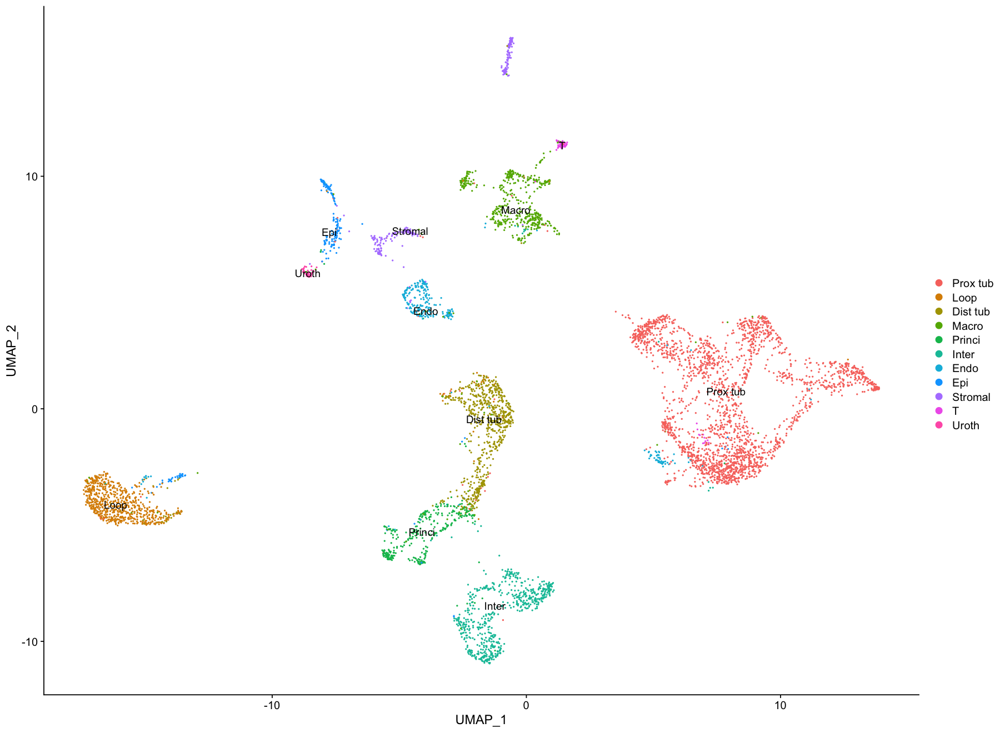

In [21]:
#conduct below if you subset out anatomical regions
#subdata <- SCTransform(subdata, assay="Spatial", verbose = FALSE) %>% RunPCA(verbose = FALSE)
DimPlot(kidney_single_reference, label = TRUE)

anchors <- FindTransferAnchors(reference = kidney_single_reference, query = data, normalization.method = "SCT")
predictions.assay <- TransferData(anchorset = anchors, refdata = kidney_single_reference@active.ident, prediction.assay = TRUE, weight.reduction = data[["pca"]])
data[["predictions"]] <- predictions.assay

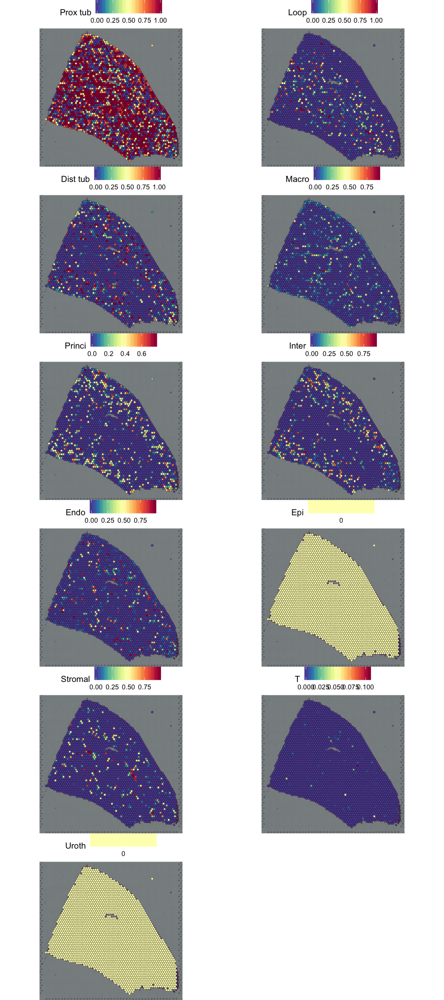

In [23]:
options(repr.plot.height=18, repr.plot.width=8)
DefaultAssay(data) <- "predictions"
SpatialFeaturePlot(data, features = c("Prox tub", "Loop", "Dist tub", "Macro", "Princi", "Inter", "Endo", "Epi", "Stromal", "T", "Uroth"), pt.size.factor = 1.6, ncol = 2, crop = TRUE)

In [24]:
rownames(data)

[1] "Prox tub" "Dist tub" "Princi"   "Macro"    "Loop"     "Inter"   
 [7] "Uroth"    "Epi"      "Stromal"  "Endo"     "T"        "max"

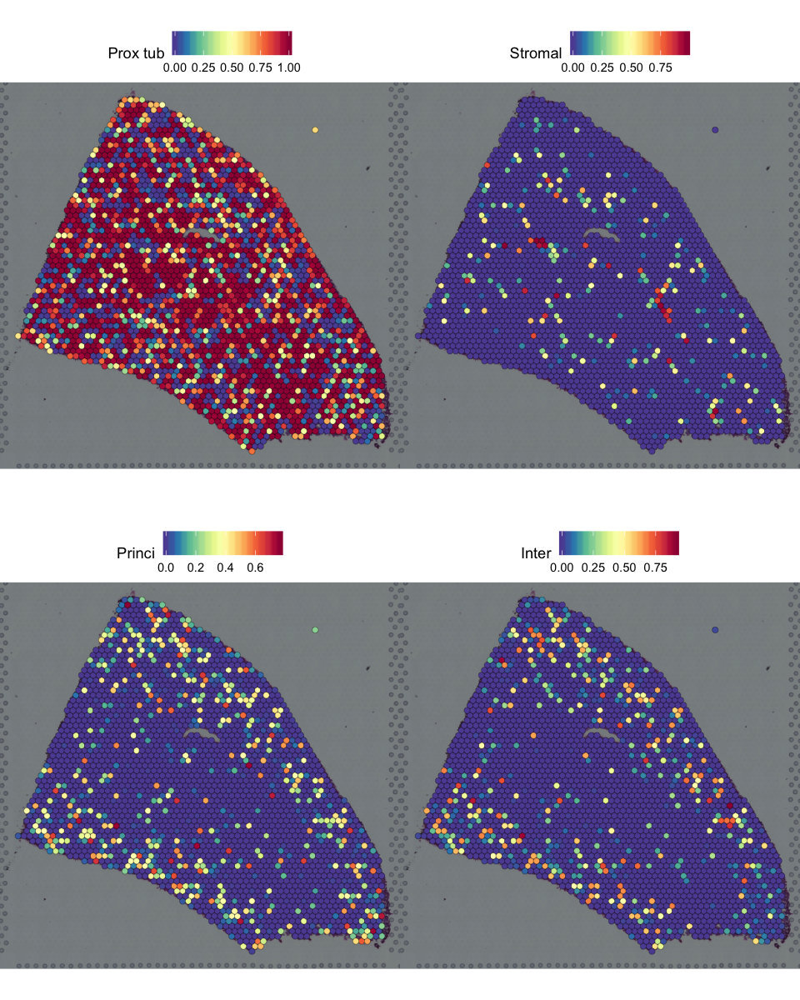

In [25]:
options(repr.plot.height=10, repr.plot.width=8)
data <- FindSpatiallyVariableFeatures(data, assay = "predictions", features = rownames(data), selection.method = "markvariogram", r.metric = 5, slot = "data")
top.clusters <- head(SpatiallyVariableFeatures(data), 4)
SpatialPlot(object = data, features = top.clusters, ncol = 2)

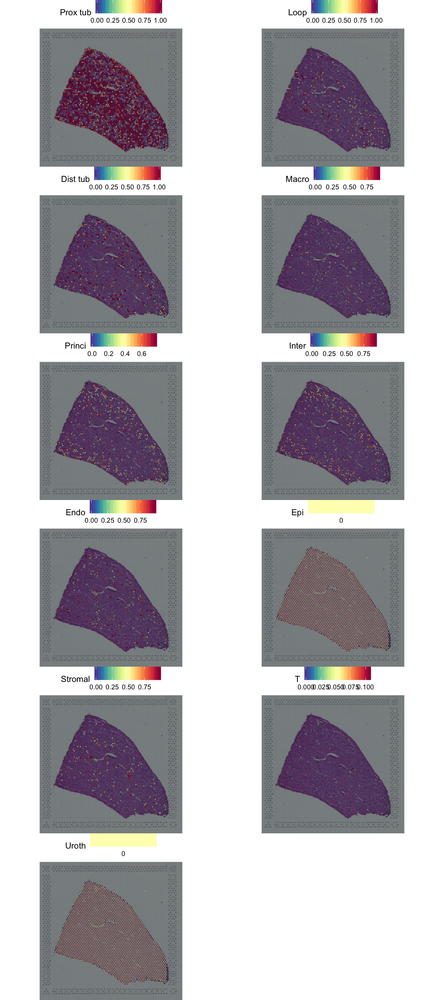

In [26]:
options(repr.plot.height=18, repr.plot.width=8)
SpatialFeaturePlot(data, features = c("Prox tub", "Loop", "Dist tub", "Macro", "Princi", "Inter", "Endo", "Epi", "Stromal", "T", "Uroth"), pt.size.factor = 1, ncol = 2, crop = FALSE, alpha = c(0.1, 1))

In [27]:
saveRDS(data, file=paste(args02, "_seurat2.rds",sep = ""))